In [174]:
import os, sys
import sdds
import numpy as np
import matplotlib.pyplot as plt

import teufel
import h5py
from xml.dom import minidom

import scipy.constants as sc
mec2 = sc.m_e*sc.c**2 / sc.e

In [175]:
HOME = os.getenv('HOME')
ROOT = os.getcwd()
print(ROOT)
WORKDIR = ROOT+'/radiator'

/home/lehnertu/DALI/Teufel_ModRad


In [176]:
sys.path.append(HOME+'/dali-beam-dynamics/scripts')
import particletoolbox as PTB

In [177]:
TEUFEL_BINARY = HOME+'/Programming/teufel/build/teufel'
!ls -l {TEUFEL_BINARY}

-rwxrwxr-x 1 lehnertu lehnertu 1197128 Dez 18 09:53 /home/lehnertu/Programming/teufel/build/teufel


# Run a modulated beam through an Undulator (U100)
## using TEUFEL to see the beam evolutionwithout FEL interaction

## Generate a modulated beam (SDDS format)

In [4]:
# kinetic electron beam energy
E_beam = 30.0e6
γ = E_beam/mec2 + 1.0
βγ = np.sqrt(γ**2-1.0)
β = np.sqrt(1.0-1.0/γ**2)
# radiation wavelength
λ = 100.0e-6
# undulator period
λ_U = 0.100
# undulator strength
K_rms = np.sqrt(λ/λ_U*2*γ**2-1.0)
print(f'K_rms = {K_rms:.3f}')
# emittance
ϵ_n = 10.0e-6
ϵ_g = ϵ_n / βγ
print(f'ϵ_g = {1e6*ϵ_g:.3f} mm mrad')

K_rms = 2.476
ϵ_g = 0.168 mm mrad


In [5]:
# matched beam beta function
β_x = 1.0
σ_x = np.sqrt(ϵ_g*β_x)
σ_xp = np.sqrt(ϵ_g/β_x)
β_y = γ*λ_U/(2*np.pi*K_rms)
σ_y = np.sqrt(ϵ_g*β_y)
σ_yp = np.sqrt(ϵ_g/β_y)

# bunch length
τ = 0.4e-12
σ_z = τ*β*sc.c

# beam parameters
NOP = 10000
charge = 1.0e-9

# x, y, z, BGx, BGy, BGz, Gamma
beam = PTB.GenerateGaussianBunch(nop=NOP, sigma_x=σ_x, sigma_y=σ_y, sigma_z=σ_z,
                                 sigma_x_prime=σ_xp, sigma_y_prime=σ_yp, mean_E_kin=E_beam, delta=1e-3)

generating spatial distribution ...
mindist set to  0.046415888336127795
bin number set to  32
10000  points generated
2577  points rejected due to hitting an occupied bin
2256  points rejected due to close neighbours
generating momentum distribution ...
assembling phase space ...


In [6]:
# back-propagate the horizontal beam by 2m (start to undulator center)
x = beam['x']-2.0*beam['BGx']/beam['BGz']
beam.update({'x':x})

# back-propagate the vertical beam by 1.0m (start to undulator entrance)
y = beam['y']-1.0*beam['BGy']/beam['BGz']
beam.update({'y':y})

# add energy modulation
δ_mod = 1.5e-2
periodic = np.sin(2*np.pi*beam['z']/λ)
beam.update({'BGx': (1.0 + δ_mod*periodic) * beam['BGx']})
beam.update({'BGy': (1.0 + δ_mod*periodic) * beam['BGy']})
beam.update({'BGz': (1.0 + δ_mod*periodic) * beam['BGz']})
beam.update({'Gamma': (1.0 + δ_mod*periodic) * beam['Gamma']})

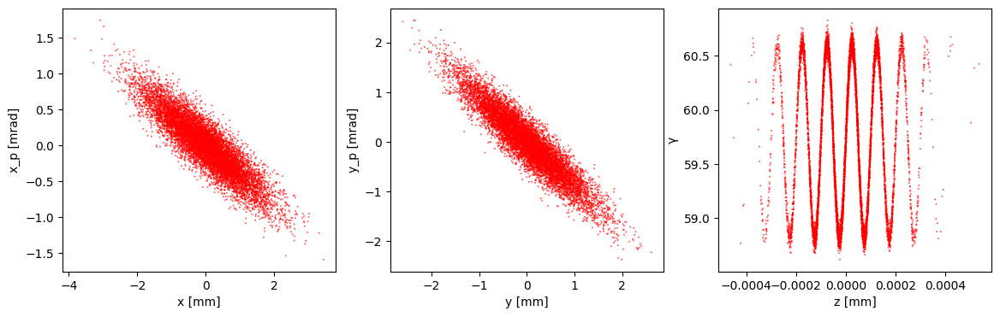

In [7]:
fig1, ((ax1, ax2, ax3)) = plt.subplots(figsize=(14,4), nrows=1, ncols=3)
ax1.scatter(1e3*beam['x'], 1e3*beam['BGx']/beam['BGz'], 0.1*np.ones_like(beam['z']), color='r')
ax1.set_xlabel('x [mm]')
ax1.set_ylabel('x_p [mrad]')
ax2.scatter(1e3*beam['y'], 1e3*beam['BGy']/beam['BGz'], 0.1*np.ones_like(beam['z']), color='r')
ax2.set_xlabel('y [mm]')
ax2.set_ylabel('y_p [mrad]')
ax3.scatter(beam['z'], beam['Gamma'], 0.1*np.ones_like(beam['z']), color='r')
ax3.set_xlabel('z [mm]')
ax3.set_ylabel('γ')
plt.show()

In [46]:
filename = WORKDIR + '/modulated_beam.sdds'

# ELEGANT uses arrival time at given z-position
# we transform z to t and write all z=0 into the file
Beta_z = beam['BGz']/beam['Gamma']
t_from_z = -beam['z'] / (Beta_z*sc.c)
BG = np.sqrt(beam['BGx']**2+beam['BGy']**2+beam['BGz']**2)
xp = beam['BGx']/beam['BGz']
yp = beam['BGy']/beam['BGz']

# write SDDS file
sdds_file = sdds.SDDS(0)
sdds_file.description[0] = "text"
sdds_file.description[1] = "contents"
# parameters ?
sdds_file.parameterName = ['Particles', 'Charge']
sdds_file.parameterData = [[NOP],[charge]]
sdds_file.parameterDefinition = [['', '', '', '', 3, ''], ['', 'C', '', '', 1, '']]
# columns
sdds_file.columnName = ['t', 'x', 'y', 'z', 'p', 'xp', 'yp']
sdds_file.columnDefinition = [['t', 's', 'Time', '', 1, 0],
                              ['x', 'm', 'PositionX', '', 1, 0],
                              ['y', 'm', 'PositionY', '', 1, 0],
                              ['z', 'm', 'PositionZ', '', 1, 0],
                              ['p', '', 'BetaGamma', '', 1, 0],
                              ['xp', '', 'Xprime', '', 1, 0],
                              ['yp', '', 'Yprime', '', 1, 0]]
sdds_file.columnData = [
    [t_from_z.tolist()],
    [beam['x'].tolist()],
    [beam['y'].tolist()],
    [[0.0]*NOP],
    [BG.tolist()],
    [xp.tolist()],
    [yp.tolist()]
]
sdds_file.save(filename)

## run TEUFEL locally

In [73]:
!ls -l {WORKDIR}

insgesamt 4296
-rw-rw-r-- 1 lehnertu lehnertu    2648 Nov 21 10:55 dali_u100_snapshot.xml
-rw-rw-r-- 1 lehnertu lehnertu  785960 Dez 18 09:04 dali-u100-superradiance_snap.h5
-rw-rw-r-- 1 lehnertu lehnertu  482048 Dez 18 09:03 dali-u100-superradience_center.h5
-rw-rw-r-- 1 lehnertu lehnertu  482048 Dez 18 09:03 dali-u100-superradience_final.h5
-rw-rw-r-- 1 lehnertu lehnertu  482048 Dez 18 09:03 dali-u100-superradience_initial.h5
-rw-rw-r-- 1 lehnertu lehnertu  121786 Dez 18 09:03 dali-u100-superradience_log.sdds
-rw-rw-r-- 1 lehnertu lehnertu  162836 Dez 18 09:03 dali-u100-superradience_obs5m.sdds
-rw-rw-r-- 1 lehnertu lehnertu 1620742 Dez 17 15:57 modulated_beam.sdds
-rw-rw-r-- 1 lehnertu lehnertu    2349 Nov 28  2022 radiator_10um.xml
-rw-rw-r-- 1 lehnertu lehnertu    2635 Dez 11 14:13 radiator_superradiance.xml
-rw-rw-r-- 1 lehnertu lehnertu    2360 Nov 25  2022 radiator.xml
-rw-rw-r-- 1 lehnertu lehnertu  233781 Nov 22 09:51 SingleCharge_Power_NumberPeriods.ipynb


In [41]:
!rm {WORKDIR}/*.h5

In [42]:
# careful - this also deletes the beam file
!rm {WORKDIR}/*.sdds

In [120]:
!gedit {WORKDIR}/radiator_superradiance.xml

In [99]:
os.chdir(WORKDIR)
!{TEUFEL_BINARY} radiator_superradiance.xml
os.chdir(ROOT)


 TEUFEL 0.11.01

 THz-Emission From Undulators and Free-Electron Lasers


 TEUFEL parallel computing on 1 nodes.

node 0 : fwl57 PID=2330534 total memory 32620 MB using 20 parallel threads
node 0 memory usage : 212.912 MB

reading XML input from radiator_superradiance.xml
input parsed without errors
case : radiation from a modulated electron beam
by : Ulf Lehnert 21.11.2024

calc : beam energy [eV] = 3e+07
calc : gamma = 58.7085
calc : beta*gamma = 58.7
calc : resonance wavelength [m] = 0.0001
calc : freq [Hz] = 2.99792e+12
calc : tracking length [m] = 4
calc : tracking total time [s] = 1.33426e-08
calc : dt = 3.33564e-12
calc : K_rms(U100) = 2.42763
U100::PlanarUndulator
calc : K_rms(U100) = 2.42763
planar undulator  N = 20,  lambda = 0.1,  K(rms) = 2.42763

lattice of 1 elements created.

reading particles from SDDS file modulated_beam.sdds
SDDS file parameters: NOP=10000  Charge=1e-09 C
SDDS mode 1
s = 0 0 1
x = 1 0 0
y = 0 -1 0

beam of 1 bunches created.
total number of particles

## plot beam envelopes

In [100]:
log_data = teufel.readTeufelBeamLog(WORKDIR+'/dali-u100-superradience_log.sdds')

In [101]:
log_data.keys()

dict_keys(['x_avg', 'y_avg', 'z_avg', 't', 'x_rms', 'y_rms', 'z_rms', 'bgx_avg', 'bgy_avg', 'bgz_avg', 'gamma', 'delta', 'BF'])

In [102]:
t = np.array(log_data['t'])
x = np.array(log_data['x_avg'])
y = np.array(log_data['y_avg'])
z = np.array(log_data['z_avg'])
x_rms = np.array(log_data['x_rms'])
y_rms = np.array(log_data['y_rms'])
z_rms = np.array(log_data['z_rms'])
bgx = np.array(log_data['bgx_avg'])
bgy = np.array(log_data['bgy_avg'])
bgz = np.array(log_data['bgz_avg'])
gamma = np.array(log_data['gamma'])
delta = np.array(log_data['delta'])
bf = np.array(log_data['BF'])
print(f'{len(t)} data points')

401 data points


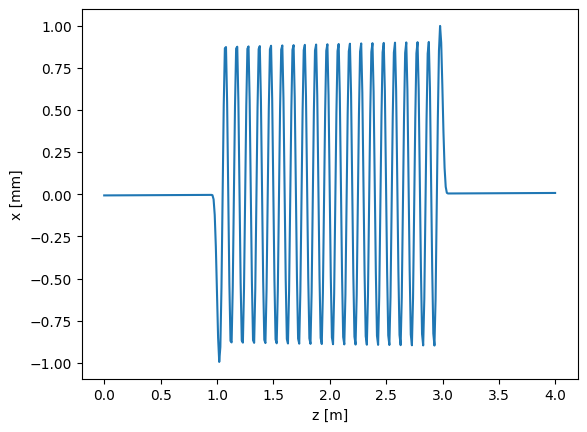

In [103]:
plt.plot(z,1e3*x)
plt.xlabel('z [m]')
plt.ylabel('x [mm]')
plt.show()

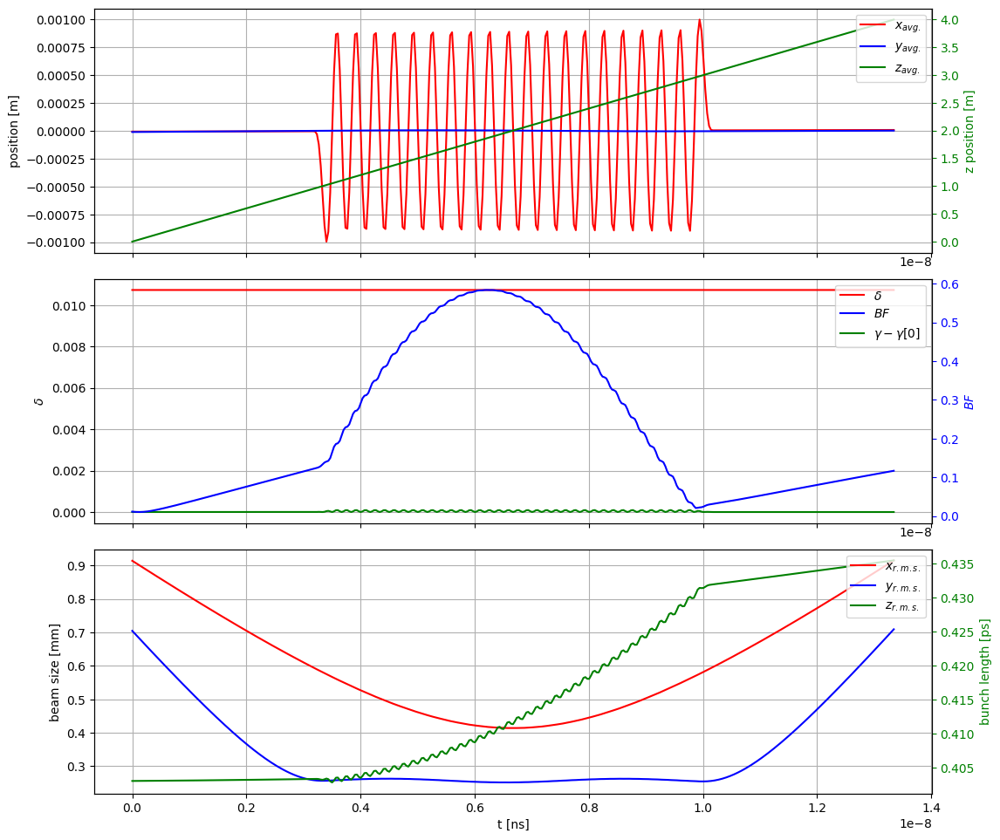

In [104]:
left, width = 0.10, 0.80
rect1 = [left, 0.68, width, 0.28]  #left, bottom, width, height
rect2 = [left, 0.37, width, 0.28]
rect3 = [left, 0.06, width, 0.28]

fig1 = plt.figure(1,figsize=(12,10))
ax1 = fig1.add_axes(rect1)
ax2 = ax1.twinx()	# separate axis for z
ax4 = fig1.add_axes(rect2, sharex=ax1)
ax5 = ax4.twinx()	# separate axis for z
ax21 = fig1.add_axes(rect3)
ax22 = ax21.twinx()	# separate axis for z

l1 = ax1.plot(t, x, "r-", label=r'$x_{avg.}$')
l2 = ax1.plot(t, y, "b-", label=r'$y_{avg.}$')
l3 = ax2.plot(t, z, "g-", label=r'$z_{avg.}$')

ax1.set_ylabel(r'position [m]')
ax1.ticklabel_format(useOffset=False)
for label in ax1.get_xticklabels():
	label.set_visible(False)
ax2.set_ylabel(r'z position [m]', color="g")
ax2.tick_params('y', colors='g')
ax2.ticklabel_format(useOffset=False)
for label in ax2.get_xticklabels():
    label.set_visible(False)
lines = l1 + l2 + l3
labels = [l.get_label() for l in lines]
ax2.legend(lines,labels,loc='upper right')
for label in ax1.get_xticklabels():
    label.set_visible(False)
ax1.grid(True)

# if plot bunching
l4 = ax4.plot(t, delta, "r-", label=r'$\delta$')
l5 = ax5.plot(t, bf, "b-", label=r'$BF$')
l6 = ax4.plot(t, gamma-gamma[0], "g-", label=r'$\gamma - \gamma[0]$')
ax4.set_ylabel(r'$\delta$')
ax4.ticklabel_format(useOffset=False)
for label in ax4.get_xticklabels():
    label.set_visible(False)
ax5.set_ylabel(r'$BF$', color="b")
ax5.tick_params('y', colors='b')
ax5.ticklabel_format(useOffset=False)
for label in ax5.get_xticklabels():
    label.set_visible(False)
lines = l4 + l5 + l6

labels = [l.get_label() for l in lines]
ax5.legend(lines,labels,loc='upper right')
ax4.grid(True)

l21 = ax21.plot(t, 1e3*x_rms, "r-", label=r'$x_{r.m.s.}$')
l22 = ax21.plot(t, 1e3*y_rms, "b-", label=r'$y_{r.m.s.}$')
l23 = ax22.plot(t, 1e12*z_rms/3.0e8, "g-", label=r'$z_{r.m.s.}$')

ax21.set_ylabel(r'beam size [mm]')
ax21.set_xlabel(r't [ns]')
ax21.ticklabel_format(useOffset=False)
ax22.set_ylabel(r'bunch length [ps]', color="g")
ax22.tick_params('y', colors='g')
ax22.ticklabel_format(useOffset=False)
lines = l21 + l22 +l23
labels = [l.get_label() for l in lines]
ax22.legend(lines,labels,loc='upper right')
ax21.grid(True)

plt.show()

## plot beam phase space from watches

In [105]:
watch = teufel.TeufelWatch.read(WORKDIR+'/dali-u100-superradience_center.h5')
print(watch.parameters())

reading  /home/lehnertu/DALI/Teufel_ModRad/radiator/dali-u100-superradience_center.h5
have read 10000 particles.
{'N': 10000, 'x_mean': 6.33136201880989e-05, 'y_mean': 2.120164333017152e-06, 'z_mean': 1.998900464869303, 'xp_mean': -0.05738217418410772, 'yp_mean': -1.0625702897121025e-05, 'bgx_mean': -3.4240080742785213, 'bgy_mean': -0.0006368349979591969, 'bgz_mean': 59.611496357668585, 'E_kin': 30004915.19678224, 'E_tot': 30515914.146778405, 'gamma': 59.7181543073767, 'betagamma': 59.709780092725, 'x_rms': 0.0004141484929235936, 'y_rms': 0.00025191015935109194, 'z_rms': 0.0001234159857582924, 't_rms': 4.1167141622452844e-13, 'E_rms': 327375.82373574795, 'ex_n_rms': 1.8079486022290777e-05, 'ey_n_rms': 1.0104531964353457e-05, 'ez_rms': 1.318085959863323e-07}


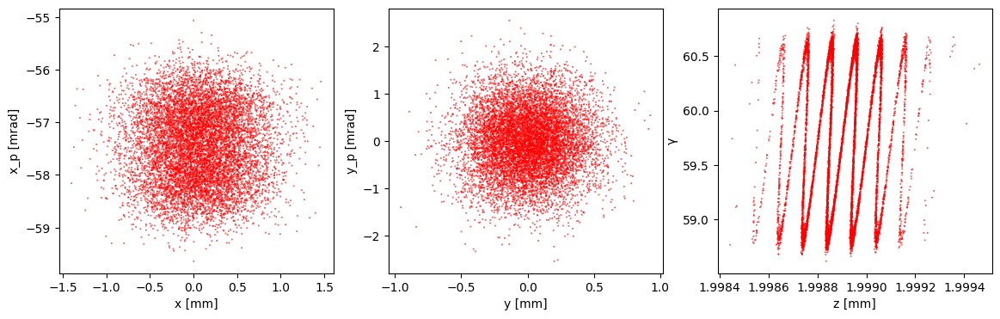

In [106]:
fig1, ((ax1, ax2, ax3)) = plt.subplots(figsize=(14,4), nrows=1, ncols=3)
ones = np.ones(watch.NOP)
ax1.scatter(1e3*watch.x, 1e3*watch.bgx/watch.bgz, 0.1*ones, color='r')
ax1.set_xlabel('x [mm]')
ax1.set_ylabel('x_p [mrad]')
ax2.scatter(1e3*watch.y, 1e3*watch.bgy/watch.bgz, 0.1*ones, color='r')
ax2.set_xlabel('y [mm]')
ax2.set_ylabel('y_p [mrad]')
ax3.scatter(watch.z, watch.gamma, 0.1*ones, color='r')
ax3.set_xlabel('z [mm]')
ax3.set_ylabel('γ')
plt.show()

In [107]:
watch = teufel.TeufelWatch.read(WORKDIR+'/dali-u100-superradience_final.h5')
print(watch.parameters())

reading  /home/lehnertu/DALI/Teufel_ModRad/radiator/dali-u100-superradience_final.h5
have read 10000 particles.
{'N': 10000, 'x_mean': 7.24164988880216e-06, 'y_mean': 1.3158517315710212e-06, 'z_mean': 3.9977972822935213, 'xp_mean': 3.2237650164156582e-06, 'yp_mean': 5.454024218956989e-06, 'bgx_mean': 0.0001894435196454046, 'bgy_mean': 0.00032865218907644626, 'bgz_mean': 59.70976152074126, 'E_kin': 30004914.956464324, 'E_tot': 30515913.906460486, 'gamma': 59.71815383708627, 'betagamma': 59.709779622368515, 'x_rms': 0.0009154558317016658, 'y_rms': 0.0007094970088835466, 'z_rms': 0.00013064387279435966, 't_rms': 4.3578105221833047e-13, 'E_rms': 327375.83739578543, 'ex_n_rms': 1.0077951116028428e-05, 'ey_n_rms': 1.0090812738372809e-05, 'ez_rms': 1.3203770029761464e-07}


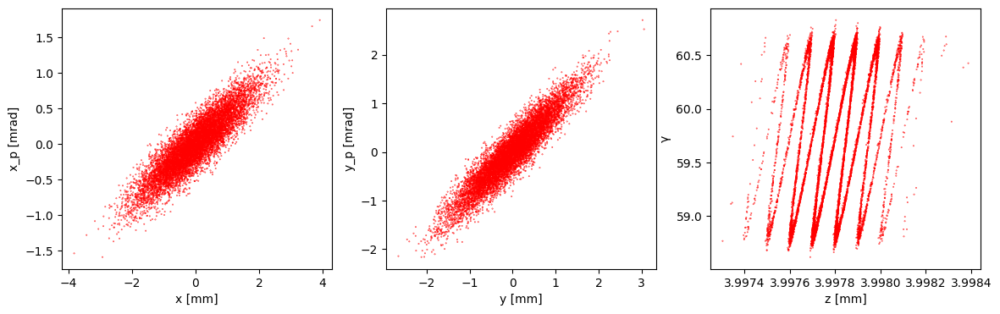

In [108]:
fig1, ((ax1, ax2, ax3)) = plt.subplots(figsize=(14,4), nrows=1, ncols=3)
ones = np.ones(watch.NOP)
ax1.scatter(1e3*watch.x, 1e3*watch.bgx/watch.bgz, 0.1*ones, color='r')
ax1.set_xlabel('x [mm]')
ax1.set_ylabel('x_p [mrad]')
ax2.scatter(1e3*watch.y, 1e3*watch.bgy/watch.bgz, 0.1*ones, color='r')
ax2.set_xlabel('y [mm]')
ax2.set_ylabel('y_p [mrad]')
ax3.scatter(watch.z, watch.gamma, 0.1*ones, color='r')
ax3.set_xlabel('z [mm]')
ax3.set_ylabel('γ')
plt.show()

## plot observed radiation on axis

In [109]:
detector_data = teufel.TeufelTimeDomain.read(WORKDIR+'/dali-u100-superradience_obs5m.sdds')

1000 steps starting at t0=    2.33e-08 s step dt=       2e-14 s
using provided time column


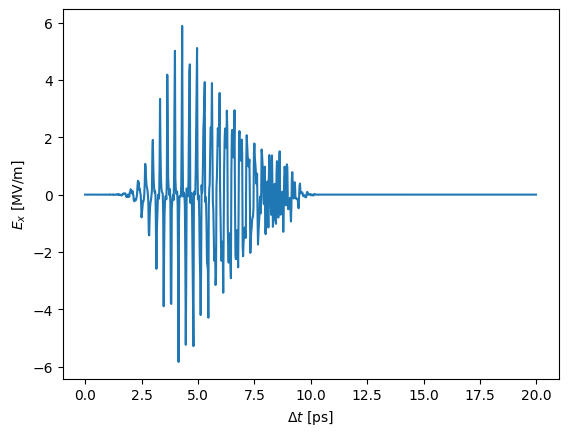

In [110]:
plt.plot(1e12*(detector_data.t-detector_data.t0), 1e-6*detector_data.Ex)
plt.xlabel('$\Delta t$ [ps]')
plt.ylabel('$E_x$ [MV/m]')
plt.show()

## run TEUFEL on HEMERA

In [4]:
import paramiko

class RemoteHost():
    def __init__(self, hostname, user):
        self.client = paramiko.client.SSHClient()
        self.client.set_missing_host_key_policy(paramiko.AutoAddPolicy())
        self.client.connect(hostname, username=user)
        self.channel = self.client.invoke_shell()
    def command(self, comm: str):
        self.channel.send(comm + "\n")
        output = ""
        while True:
            # Check for received data
            if self.channel.recv_ready():
                output += self.channel.recv(1024).decode("utf-8")
            if output.endswith("$ "):  # Assuming the prompt ends with "$ "
                break
        return output
    def close(self):
        self.client.close()

In [32]:
LOCAL_WORKDIR = '/mnt/bigdata/dali/U100_TEUFEL/FEL_radiator/'
HEMERA_WORKDIR = '/bigdata/dali/U100_TEUFEL/FEL_radiator'

In [81]:
!gedit {WORKDIR}/radiator_superradiance.xml


(gedit:1441981): Tepl-WARNING **: 14:13:10.364: GVfs metadata is not supported. Fallback to TeplMetadataManager. Either GVfs is not correctly installed or GVfs metadata are not supported on this platform. In the latter case, you should configure Tepl with --disable-gvfs-metadata.


In [90]:
lines = [
    '#!/bin/bash',
    '#SBATCH --job-name=TEUFEL    # name of the job',
    '#SBATCH --partition=defq     # partition to be used (defq, gpu or intel)',
    '#SBATCH --time=8:00:00       # walltime (up to 96 hours)',
    '#SBATCH --nodes=1            # number of nodes',
    '#SBATCH --ntasks=4           # number of MPI tasks',
    '#SBATCH --ntasks-per-node=4  # number of MPI tasks per node',
    '#SBATCH --cpus-per-task=10   # Number of CPU cores per task',
    'module load gcc',
    'module load openmpi',
    'module load zlib',
    'module load hdf5',
    'export OMP_NUM_THREADS=10',
    f'cd {HEMERA_WORKDIR}',
    'mpiexec $HOME/teufel/build/teufel radiator_superradiance.xml'
]
batch_script = "\n".join(lines)
with open(f'{LOCAL_WORKDIR}teufel.sbatch', "w") as file:
    file.write(batch_script)

In [91]:
!cp {WORKDIR}/radiator_superradiance.xml {LOCAL_WORKDIR}
!cp {WORKDIR}/modulated_beam.sdds {LOCAL_WORKDIR}

In [92]:
hemera = RemoteHost("hemera5", "lehnertu")
print(hemera.command(f'cd {HEMERA_WORKDIR}'))
print(hemera.command(f'qsub teufel.sbatch'))
# the shell connection stays open

Last login: Wed Dec 11 14:13:21 2024 from 149.220.79.134
cd /bigdata/dali/U100_TEUFEL/FEL_radiator

ULIMIT: Your CPU time per process on the login node is limited to 300 seconds!
        Please use interactive jobs for long compile/test runs.


GPFS Quota
----------
You use 264.3G of Your home directory quota of 600G.

lehnertu@hemera5:~$ cd /bigdata/dali/U100_TEUFEL/FEL_radiator
lehnertu@hemera5:/bigdata/dali/U100_TEUFEL/FEL_radiator$ 
qsub teufel.sbatch
9155517
lehnertu@hemera5:/bigdata/dali/U100_TEUFEL/FEL_radiator$ 


In [93]:
print(hemera.command(f'qstat -u lehnertu'))

qstat -u lehnertu

hemera5.cluster:
                                                                               Req'd  Req'd   Elap 
Job id               Username Queue    Name                 SessID NDS   TSK   Memory Time Use S Time 
-------------------- -------- -------- -------------------- ------ ----- ----- ------ ----- - -----
9155515              lehnertu defq     TEUFEL               --         2    80     -- 08:00 C 00:00
9155517              lehnertu defq     TEUFEL               --         1    40     -- 08:00 R 00:00
lehnertu@hemera5:/bigdata/dali/U100_TEUFEL/FEL_radiator$ 


In [94]:
# close the shell
hemera.close()

In [97]:
!ls -l {LOCAL_WORKDIR}

insgesamt 353537
-rwxrwxrwx 1 root root    306056 Dez 11 14:17 dali-u100-superradiance_snap.h5
-rwxrwxrwx 1 root root    482144 Dez 11 14:16 dali-u100-superradience_center.h5
-rwxrwxrwx 1 root root    482144 Dez 11 14:16 dali-u100-superradience_final.h5
-rwxrwxrwx 1 root root    482144 Dez 11 14:16 dali-u100-superradience_initial.h5
-rwxrwxrwx 1 root root    121786 Dez 11 14:16 dali-u100-superradience_log.sdds
-rwxrwxrwx 1 root root    162836 Dez 11 14:17 dali-u100-superradience_obs5m.sdds
-rwxrwxrwx 1 root root 357311544 Nov 22 11:42 dali-u100-superradience_screen5m.h5
-rwxrwxrwx 1 root root   1620742 Dez 11 14:16 modulated_beam.sdds
-rwxrwxrwx 1 root root      2635 Dez 11 14:16 radiator_superradiance.xml
-rwxrwxrwx 1 root root       605 Dez 11 14:16 teufel.sbatch


In [45]:
!cat {LOCAL_WORKDIR}teufel.sbatch.o9060903


 TEUFEL 0.10.01

 THz-Emission From Undulators and Free-Electron Lasers


 TEUFEL parallel computing on 4 nodes.

node 1 : csk001.cluster PID=77652 total memory 394901 MB using 20 parallel threads
node 1 memory usage : 437.976 MB
node 0 : csk001.cluster PID=77651 total memory 394901 MB using 20 parallel threads
node 0 memory usage : 437.976 MB
node 3 : csk025.cluster PID=164462 total memory 394901 MB using 20 parallel threads
node 2 : csk025.cluster PID=164461 total memory 394901 MB using 20 parallel threads
node 3 memory usage : 437.976 MB
node 2 memory usage : 437.976 MB

reading XML input from radiator_superradiance.xml
input parsed without errors
case : radiation from a modulated electron beam
by : Ulf Lehnert 21.11.2024

calc : beam energy [eV] = 3e+07
calc : gamma = 58.7085
calc : beta*gamma = 58.7
calc : resonance wavelength [m] = 0.0001
calc : freq [Hz] = 2.99792e+12
calc : tracking length [m] = 4
calc : tracking total time [s] = 1.33426e-08
calc : dt = 3.33564e-12
calc : K_rm

## plot screen data

In [46]:
screen = teufel.TeufelScreen.read(LOCAL_WORKDIR+'dali-u100-superradience_screen5m.h5')

Nx=61 Ny=61 Nots=2000
origin= (0, 0, 7) m
normal= (-0, -0, -1) m
dX= (0.005, 0, 0) m
dY= (0, 0.005, 0) m
t0=2.33475e-08 dt=2e-14 dtx=0 dty=0


In [47]:
print(f'total Energy = {1e3*screen.totalEnergy():.4g} mJ')

total Energy = 0.9138 mJ


In [48]:
t = np.linspace(screen.t0, screen.t0+screen.nots*screen.dt, num=screen.nots)

(E,B) = screen.getFieldTrace(screen.Nx//2, screen.Ny//2)
Ex_0 = E[:,0]
(E,B) = screen.getFieldTrace(screen.Nx//4, screen.Ny//4)
Ex_1 = E[:,0]
(E,B) = screen.getFieldTrace(0, 0)
Ex_2 = E[:,0]

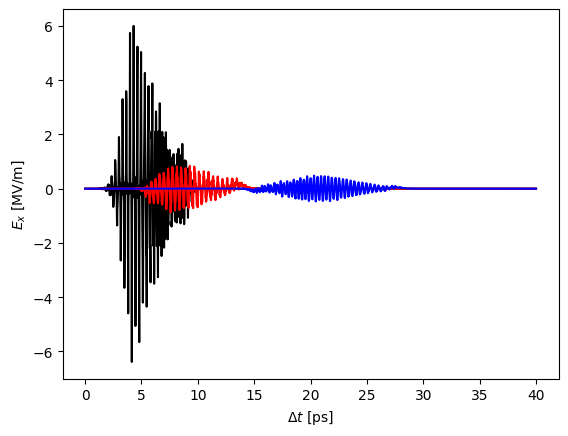

In [56]:
plt.plot(1e12*(t-screen.t0), 1e-6*Ex_0, 'k')
plt.plot(1e12*(t-screen.t0), 1e-6*Ex_1, 'r')
plt.plot(1e12*(t-screen.t0), 1e-6*Ex_2, 'b')
plt.xlabel('$\Delta t$ [ps]')
plt.ylabel('$E_x$ [MV/m]')
plt.show()

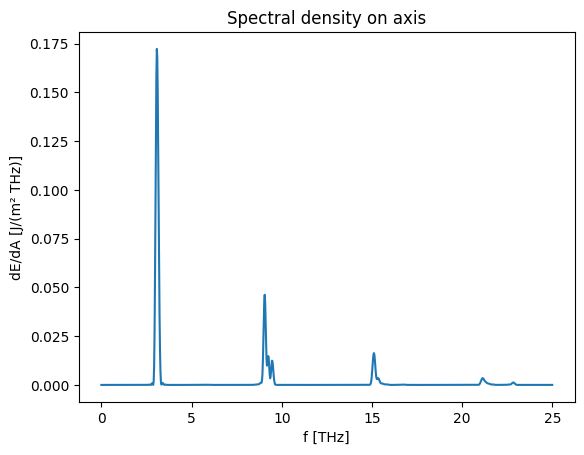

In [57]:
(f, ampli) = screen.spectralDensityH(screen.Nx//2,screen.Ny//2)
plt.plot(1e-12*f,1e12*ampli)
plt.title('Spectral density on axis')
plt.xlabel('f [THz]')
plt.ylabel('dE/dA [J/(m² THz)]')
plt.show()

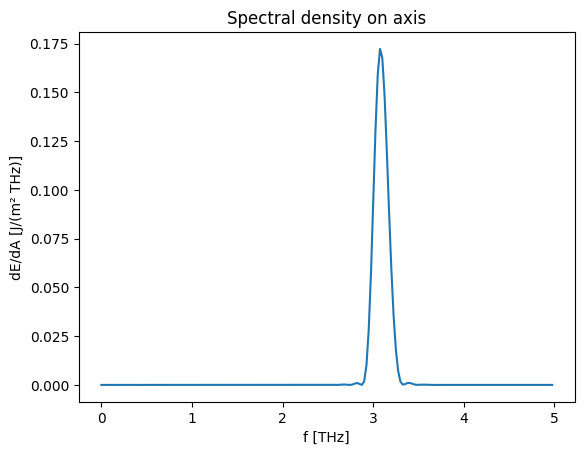

In [59]:
plt.plot(1e-12*f[:200],1e12*ampli[:200])
plt.title('Spectral density on axis')
plt.xlabel('f [THz]')
plt.ylabel('dE/dA [J/(m² THz)]')
plt.show()

total Energy = 0.8773 mJ


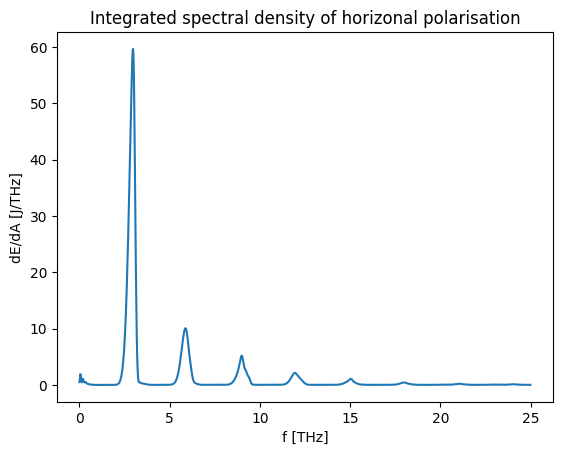

In [63]:
total = 0.0
spectrum = np.zeros_like(f)
for ix in range(screen.Nx):
    for iy in range(screen.Ny):
        (f, ampli) = screen.spectralDensityH(ix,iy)
        spectrum = spectrum + ampli
        total = total + ampli.sum()*screen.df()
print(f'total Energy = {1e3*total*screen.dx*screen.dy:.4g} mJ')

plt.plot(1e-12*f,1e12*spectrum)
plt.title('Integrated spectral density of horizonal polarisation')
plt.xlabel('f [THz]')
plt.ylabel('dE/dA [J/THz]')
plt.show()

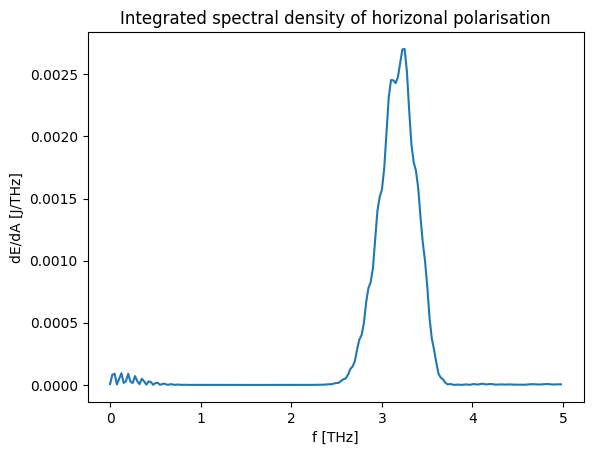

In [64]:
plt.plot(1e-12*f[:200],1e12*ampli[:200])
plt.title('Integrated spectral density of horizonal polarisation')
plt.xlabel('f [THz]')
plt.ylabel('dE/dA [J/THz]')
plt.show()

In [65]:
X = np.empty([screen.Nx, screen.Ny])
Y = np.empty([screen.Nx, screen.Ny])
Pz = np.empty([screen.Nx, screen.Ny])
for ix in range(screen.Nx):
    for iy in range(screen.Ny):
        (x,y) = screen.screenPos(ix,iy)
        X[ix,iy] = x
        Y[ix,iy] = y
        Pz[ix,iy] = screen.totalPowerDensity(ix,iy)
Etot = Pz.sum()*screen.dx*screen.dy
print("integrated energy = ", 1e6*Etot, " µJ")

integrated energy =  913.8424897253021  µJ


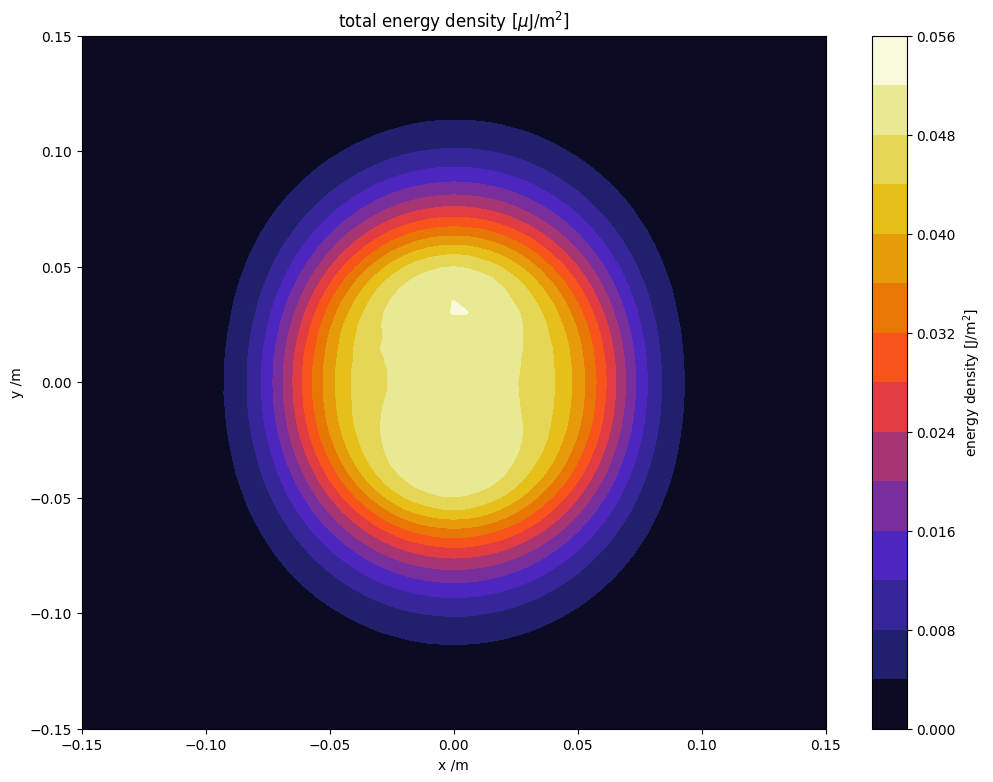

In [66]:
fig2 = plt.figure(2,figsize=(12,9))
ax3 = fig2.add_subplot(111)
plt.contourf(X, Y, Pz, 15, cmap='CMRmap')
plt.title('total energy density [$\mu$J/m$^2$]')
plt.xlabel('x /m')
plt.ylabel('y /m')
cb=plt.colorbar()
cb.set_label(r'energy density [J/m$^2$]')
plt.show()

## plot snapshot

In [150]:
C

<HDF5 file "dali-u100-superradiance_snap.h5" (mode r)>
<KeysViewHDF5 ['ElMagField', 'ObservationPosition', 'ParticleCoordinates']>
<HDF5 dataset "ObservationPosition": shape (21, 201, 3), type "<f8">
Nx=21 Ny=201
<HDF5 dataset "ElMagField": shape (21, 201, 6), type "<f8">
<HDF5 dataset "ParticleCoordinates": shape (10000, 6), type "<f8">
Npart=10000


In [151]:
xcenter = (Nx-1)//2
ycenter = (Ny-1)//2
centerposition = pos[xcenter][ycenter]
print("center position = ",centerposition)

center position =  [0.     0.     1.9995]


In [152]:
Ex = A[:,:,0]
Ey = A[:,:,1]
Ez = A[:,:,2]
Bx = A[:,:,3]
By = A[:,:,4]
Bz = A[:,:,5]

In [153]:
x_part = coo[:,0]
z_part = coo[:,2]
np.mean(z_part)

1.9989004648693618

In [154]:
print(pos.shape)
x = pos[:,:,0]
print(np.min(x), np.max(x))
z = pos[:,:,2]
print(np.min(z), np.max(z))

(21, 201, 3)
-0.005 0.005
1.9985000000000002 2.0005


378496965.07427806


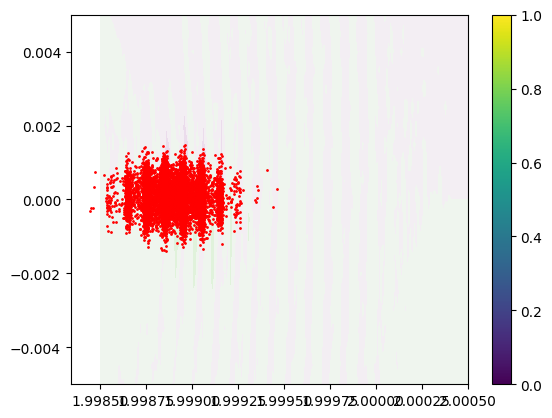

In [155]:
emax = np.max(np.abs(Ex))
print(emax)
emax = 1e9
elevels = np.linspace(-emax, emax, num=21)

plt.contourf(z,x,Ex,elevels,cmap='PRGn')
plt.scatter(z_part,x_part,c='r',s=1)
plt.colorbar()
plt.show()

In [226]:
print("Ex range %g ... %g"%(np.min(Ex),np.max(Ex)))
SignEx = np.sign(Ex)
AbsEx = np.fabs(Ex)
cut = 1.0e-3*np.max(AbsEx)
AbsEx = AbsEx+cut
print("fabs(Ex) range %g ... %g"%(np.min(AbsEx),np.max(AbsEx)))
LogEx = np.log(AbsEx)
LogCut = np.log(cut)
LogEx = LogEx-LogCut
LogMax = np.max(LogEx)-2
loglevels = np.linspace(-LogMax, LogMax, num=11)
print("log(fabs(Ex)) range %g ... %g"%(np.min(LogEx),np.max(LogEx)))
LogEx = LogEx*SignEx

Ex range -3.78497e+08 ... 3.25717e+08
fabs(Ex) range 378505 ... 3.78875e+08
log(fabs(Ex)) range 2.13371e-05 ... 6.90875


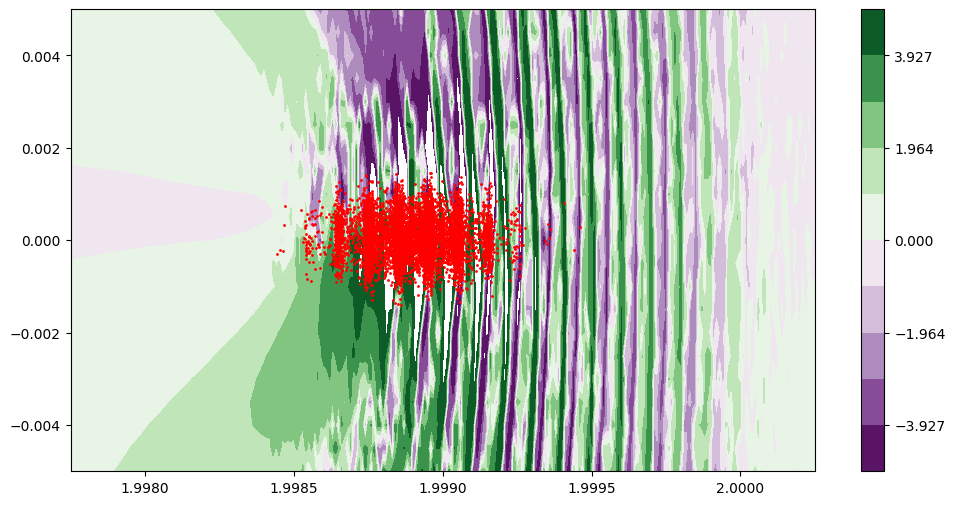

In [227]:
fig = plt.figure(figsize=(12,6))
ax = fig.gca()
img = ax.contourf(z,x,LogEx,loglevels,cmap='PRGn')
cbar = fig.colorbar(img)
# cbar.set_ticklabels([])
plt.scatter(z_part,x_part,c='r',s=1)
plt.show()

## sequence of many snapshots

In [294]:
xmldoc = minidom.parse(WORKDIR+'/radiator_superradiance_no_observer.xml')
xmltop = xmldoc.documentElement
print(xmltop.tagName)

teufel


In [295]:
def remove_whitespace(node):
    """
    A procedure to remove unneccesary whitespace
    that hinders pretty formatting of an XML file
    """
    for child in node.childNodes[:]:
        if child.nodeType == minidom.Node.TEXT_NODE and not child.data.strip():
            # Remove empty text nodes
            node.removeChild(child)
        elif child.nodeType == minidom.Node.ELEMENT_NODE:
            # Recursively process child elements
            remove_whitespace(child)

In [296]:
observer = xmltop.getElementsByTagName('observer')[0]

# create new observers
for z_mm in range(1000,2001,10):
    z_snap = 0.001*z_mm
    # add a snapshot
    snap = xmldoc.createElement('snapshot')
    snap.setAttribute( "file", f'dali-u100-superradiance_snap_{z_mm}.h5' )
    snap_time = xmldoc.createElement('time')
    snap_time.setAttribute( "t0", f'{z_snap:.3f}/_c' )
    snap.appendChild(snap_time)
    snap_pos = xmldoc.createElement('position')
    snap_pos.setAttribute( "x", '0.0' )
    snap_pos.setAttribute( "y", '0.0' )
    snap_pos.setAttribute( "z", f'{z_snap:.3f}-7.5*lambda_R' )
    snap.appendChild(snap_pos)
    snap_h = xmldoc.createElement('hpitch')
    snap_h.setAttribute( "x", '0.000500' )
    snap_h.setAttribute( "y", '0.0' )
    snap_h.setAttribute( "z", '0.0' )
    snap_h.setAttribute( "n", '21' )
    snap.appendChild(snap_h)
    snap_v = xmldoc.createElement('vpitch')
    snap_v.setAttribute( "x", '0.0' )
    snap_v.setAttribute( "y", '0.0' )
    snap_v.setAttribute( "z", '0.1*lambda_R' )
    snap_v.setAttribute( "n", '251' )
    snap.appendChild(snap_v)
    observer.appendChild(snap)

In [297]:
remove_whitespace(xmldoc)
file_handle = open(WORKDIR+'/radiator_superradiance_sequence.xml',"w")
xmldoc.writexml(file_handle, indent="  ", addindent="  ", newl="\n")
file_handle.close()

In [298]:
os.chdir(WORKDIR)
!{TEUFEL_BINARY} radiator_superradiance_sequence.xml
os.chdir(ROOT)


 TEUFEL 0.11.01

 THz-Emission From Undulators and Free-Electron Lasers


 TEUFEL parallel computing on 1 nodes.

node 0 : fwl57 PID=2352914 total memory 32620 MB using 20 parallel threads
node 0 memory usage : 212.912 MB

reading XML input from radiator_superradiance_sequence.xml
input parsed without errors
case : radiation from a modulated electron beam
by : Ulf Lehnert 21.11.2024

calc : beam energy [eV] = 3e+07
calc : gamma = 58.7085
calc : beta*gamma = 58.7
calc : resonance wavelength [m] = 0.0001
calc : freq [Hz] = 2.99792e+12
calc : tracking length [m] = 4
calc : tracking total time [s] = 1.33426e-08
calc : dt = 3.33564e-12
calc : K_rms(U100) = 2.42763
U100::PlanarUndulator
calc : K_rms(U100) = 2.42763
planar undulator  N = 20,  lambda = 0.1,  K(rms) = 2.42763

lattice of 1 elements created.

reading particles from SDDS file modulated_beam.sdds
SDDS file parameters: NOP=10000  Charge=1e-09 C
SDDS mode 1
s = 0 0 1
x = 1 0 0
y = 0 -1 0

beam of 1 bunches created.
total number of 

In [280]:
def make_plot(fig, z_mm):
    # open the file
    hdf = h5py.File(WORKDIR+f'/dali-u100-superradiance_snap_{z_mm}.h5', "r")
    # Get the groups
    pos_group = hdf['ObservationPosition']
    Nx = pos_group.attrs.get('Nx')
    Ny = pos_group.attrs.get('Ny')
    field_group = hdf['ElMagField']
    par_group = hdf['ParticleCoordinates']
    N_par = par_group.attrs.get('N_particles')
    # get the data
    pos = np.array(pos_group)
    A = np.array(field_group)
    coo = np.array(par_group)
    hdf.close()
    
    Ex = A[:,:,0]
    x = pos[:,:,0]
    z = pos[:,:,2]
    x_part = coo[:,0]
    z_part = coo[:,2]
    
    top = 1e9
    cut = 1e6
    signEx = np.sign(Ex)
    absEx = np.fabs(Ex)
    logEx = np.log10(absEx+cut)
    logRange = np.log10(top)-np.log10(cut)
    logPlot = (logEx-np.log10(cut))*signEx
    loglevels = np.linspace(-logRange, logRange, num=21)
    
    ax = fig.gca()
    img = ax.contourf(z,x,logPlot,loglevels,cmap='PRGn')
    cbar = fig.colorbar(img)
    cbar.set_label('$E_x$ [MV/m]')
    cbar.set_ticks([-3,-2,-1,0,1,2,3])
    cbar.set_ticklabels(['$-10^3$','$-10^2$','$-10^1$','$\pm$1','$10^1$','$10^2$','$10^3$'])
    plt.scatter(z_part,x_part,c='r',s=5, alpha=0.05)

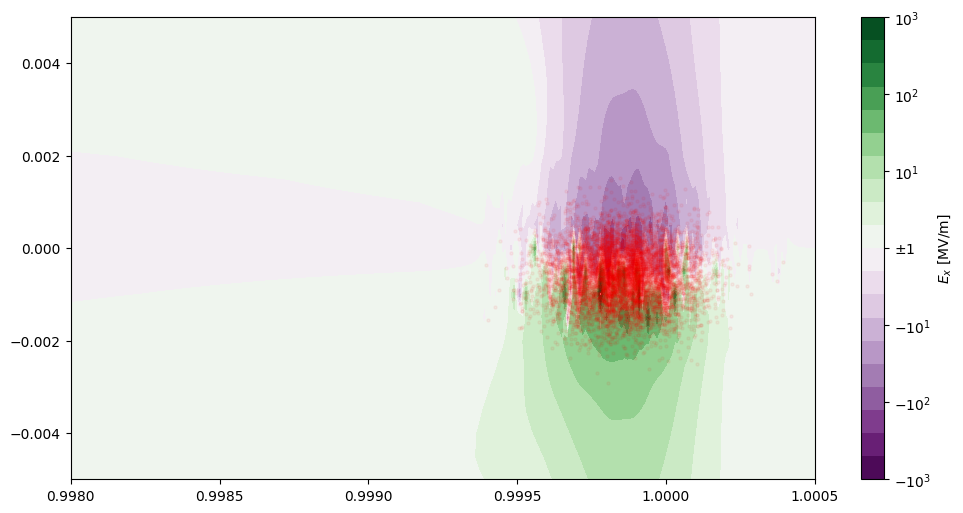

In [299]:
fig = plt.figure(figsize=(12,6))
make_plot(fig, 1000)
plt.show()

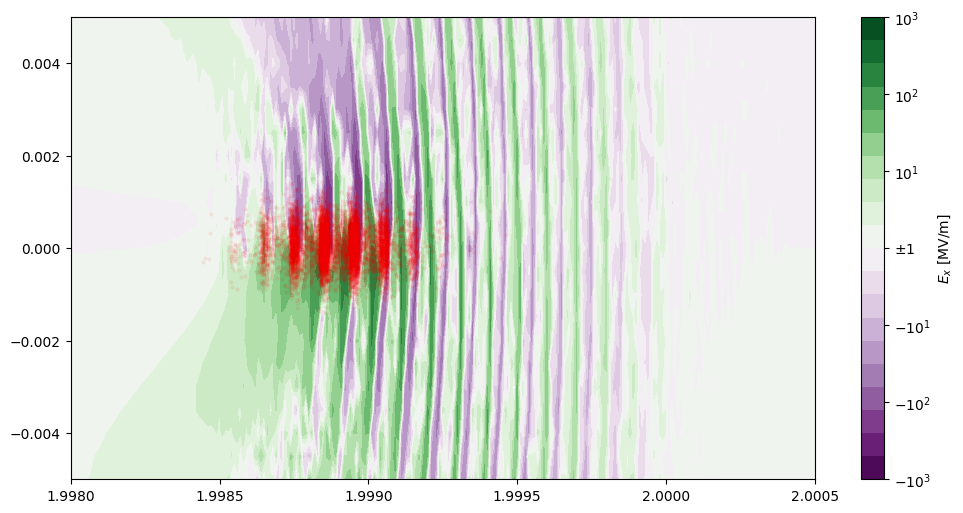

In [300]:
fig = plt.figure(figsize=(12,6))
make_plot(fig, 2000)
plt.show()

In [301]:
frame_files = []
for z_mm in range(1000,2001,10):
    fig = plt.figure(figsize=(12,6))
    make_plot(fig, z_mm)
    filename = WORKDIR+f'/dali-u100-superradiance_snap_{z_mm}.png'
    frame_files.append(filename)
    plt.savefig(filename)
    plt.close()

In [302]:
from PIL import Image
# create an animated GIF
frames = [Image.open(file) for file in frame_files]
frames[0].save("animated_plot.gif", save_all=True, append_images=frames[1:], duration=200, loop=0)


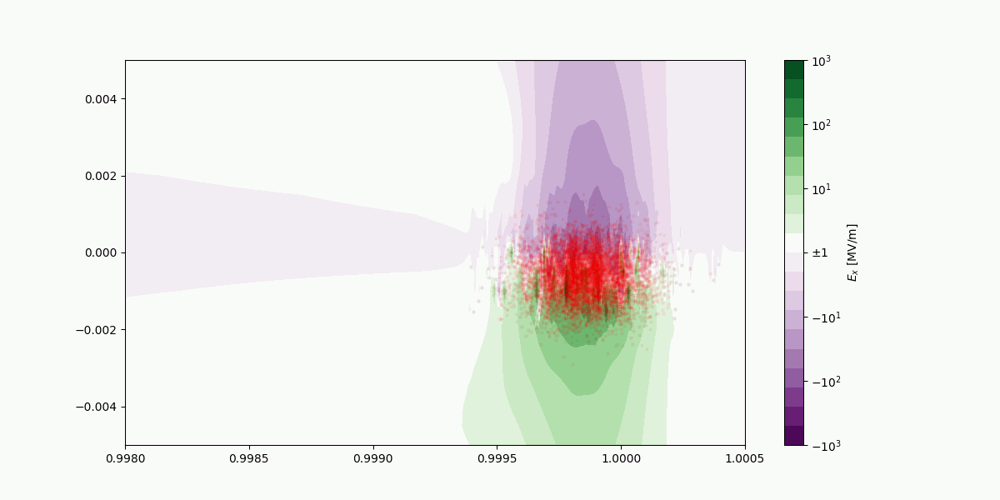

In [303]:
from IPython.display import Image as IPImage
from IPython.display import display

display(IPImage(filename="animated_plot.gif"))


In [304]:
# Cleanup temporary frame files
for file in frame_files:
    os.remove(file)